# Lab assignment №1, part 2

This lab assignment consists of several parts. You are supposed to make some transformations, train some models, estimate the quality of the models and explain your results.

Several comments:
* Don't hesitate to ask questions, it's a good practice.
* No private/public sharing, please. The copied assignments will be graded with 0 points.
* Blocks of this lab will be graded separately.

__*This is the second part of the assignment. First and third parts are waiting for you in the same directory.*__

## Part 2. Data preprocessing, model training and evaluation.

### 1. Reading the data
Today we work with the [dataset](https://archive.ics.uci.edu/ml/datasets/Statlog+%28Vehicle+Silhouettes%29), describing different cars for multiclass ($k=4$) classification problem. The data is available below.

In [1]:
import os

def download_file_if_not_exists(url, file_path):
    """
    Загружает файл с внешнего ресурса, если его нет по указанному пути.
    :param url: URL-адрес файла для загрузки
    :param file_path: Локальный путь, по которому должен находиться файл
    """
    if not os.path.exists(file_path):
        print(f"Файл не найден по пути {url}{file_path}. Загружаю файл...")
        os.system(f'wget {url}{file_path}')
        print(f"\nФайл успешно загружен по пути {file_path}.")
    else:
        print(f"Файл уже существует по пути {file_path}.")

# Пример использования функции
url = 'https://raw.githubusercontent.com/girafe-ai/ml-course/22f_made/homeworks/lab01_ml_pipeline/'
file_path = '/path/to/your/local/file.txt'
download_file_if_not_exists(url, 'car_data.csv')
download_file_if_not_exists(url, 'column_names.json')

Файл уже существует по пути car_data.csv.
Файл уже существует по пути column_names.json.


In [4]:
import ipywidgets as widgets
from IPython.display import display
slider = widgets.IntSlider(min=0, max=10, step=1, description='Slide me:')
display(slider)

IntSlider(value=0, description='Slide me:', max=10)

| N | Наименование | Описание | Тип данных |
|---|---|---|---|
|1. | **COMPACTNESS** | Мера компактности объекта, определяющая, насколько плотно объект заполнен. | Числовой |
|2. | **CIRCULARITY** | Мера круговой формы объекта, оценивающая отклонение объекта от идеальной окружности. | Числовой  |
|3. | **DISTANCE CIRCULARITY** | Оценка соотношения между длиной окружности объекта и его диаметром. | Числовой  |
|4. | **RADIUS RATIO** | Отношение радиусов различных частей объекта. | Числовой |
|5. | **PRAXIS ASPECT RATIO** | Отношение длин сторон объекта, измеренное вдоль главной оси. | Числовой |
|6. | **MAXLENGTH ASPECT RATIO** | Отношение максимальной длины объекта к его ширине. | Числовой |
|7. | **SCATTER RATIO** | Мера рассеивания точек объекта относительно центра. | Числовой |
|8. | **ELONGATEDNESS** | Мера вытянутости объекта, показывающая насколько объект длинный и узкий. | Числовой |
|9. | **PRAXIS RECTANGULARITY** | Мера прямоугольности объекта, измеренная вдоль главной оси. | Числовой |
|10. | **MAXLENGTH RECTANGULARITY** | Оценка прямоугольности объекта, основанная на его максимальной длине. | Числовой |
|11. | **SCALED VARIANCE ALONG MAJOR AXIS** | Масштабированное значение дисперсии вдоль главной оси объекта. | Числовой |
|12. | **SCALED VARIANCE ALONG MINOR AXIS** | Масштабированное значение дисперсии вдоль второстепенной оси объекта. | Числовой |
|13. | **SCALED RADIUS OF GYRATION** | Масштабированное значение радиуса вращения объекта. | Числовой |
|14. | **SKEWNESS ABOUT MAJOR AXIS** | Коэффициент асимметрии распределения данных вдоль главной оси. | Числовой |
|15. | **SKEWNESS ABOUT MINOR AXIS** | Коэффициент асимметрии распределения данных вдоль второстепенной оси. | Числовой |
|16. | **KURTOSIS ABOUT MINOR AXIS** | Коэффициент эксцесса распределения данных вдоль второстепенной оси. | Числовой |
|17. | **KURTOSIS ABOUT MAJOR AXIS** | Коэффициент эксцесса распределения данных вдоль главной оси. | Числовой |
|18. | **HOLLOWS RATIO** | Отношение полостей или пустот внутри объекта. | Числовой |
|19. | **CLASS LABEL** | Метка класса, указывающая на категорию объекта. | Категориальный (классовый) |

In [5]:
import seaborn as sns
import pandas as pd
import json

# Load the column names from the JSON file
with open('column_names.json', 'r') as file:
    column_names = json.load(file)
dataset = pd.read_csv('car_data.csv', delimiter=',', header=None)
dataset = dataset.set_index(0)
dataset.columns = column_names
dataset.sample(10)

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PRAXIS ASPECT RATIO,MAXLENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PRAXIS RECTANGULARITY,MAXLENGTH RECTANGULARITY,SCALED VARIANCE ALONG MAJOR AXIS,SCALED VARIANCE ALONG MINOR AXIS,SCALED RADIUS OF GYRATION,SKEWNESS ABOUT MAJOR AXIS,SKEWNESS ABOUT MINOR AXIS,KURTOSIS ABOUT MINOR AXIS,KURTOSIS ABOUT MAJOR AXIS,HOLLOWS RATIO,CLASS LABEL
0,,,,,,,,,,,,,,,,,,,
184,103,46,106,209,66,10,203,33,23,149,217,612,210,70,9,10,191,199,saab
517,107,54,108,228,68,12,218,31,25,170,223,700,224,67,13,25,190,204,saab
488,82,39,86,140,54,7,153,45,19,134,174,338,139,71,11,18,183,189,opel
822,95,41,82,170,65,9,145,46,19,145,163,314,140,64,4,8,199,207,van
301,93,43,78,166,59,7,151,44,19,141,182,342,174,68,15,2,193,197,opel
632,86,44,70,140,64,6,148,45,19,145,170,322,185,82,10,1,181,183,bus
211,86,37,69,150,63,8,138,48,18,134,163,284,124,71,1,6,189,195,van
110,89,40,77,159,65,9,144,46,19,141,168,314,143,70,0,5,190,200,van
114,93,43,85,133,54,10,155,44,19,153,174,351,165,75,12,13,184,196,van


In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   COMPACTNESS                       846 non-null    int64 
 1   CIRCULARITY                       846 non-null    int64 
 2   DISTANCE CIRCULARITY              846 non-null    int64 
 3   RADIUS RATIO                      846 non-null    int64 
 4   PRAXIS ASPECT RATIO               846 non-null    int64 
 5   MAXLENGTH ASPECT RATIO            846 non-null    int64 
 6   SCATTER RATIO                     846 non-null    int64 
 7   ELONGATEDNESS                     846 non-null    int64 
 8   PRAXIS RECTANGULARITY             846 non-null    int64 
 9   MAXLENGTH RECTANGULARITY          846 non-null    int64 
 10  SCALED VARIANCE ALONG MAJOR AXIS  846 non-null    int64 
 11  SCALED VARIANCE ALONG MINOR AXIS  846 non-null    int64 
 12  SCALED RADIUS OF GYRATION  

In [7]:
dataset.describe()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PRAXIS ASPECT RATIO,MAXLENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PRAXIS RECTANGULARITY,MAXLENGTH RECTANGULARITY,SCALED VARIANCE ALONG MAJOR AXIS,SCALED VARIANCE ALONG MINOR AXIS,SCALED RADIUS OF GYRATION,SKEWNESS ABOUT MAJOR AXIS,SKEWNESS ABOUT MINOR AXIS,KURTOSIS ABOUT MINOR AXIS,KURTOSIS ABOUT MAJOR AXIS,HOLLOWS RATIO
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.00000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.861702,82.088652,168.940898,61.693853,8.567376,168.839243,40.933806,20.582742,147.998818,188.625296,439.911348,174.70331,72.462175,6.377069,12.599291,188.932624,195.632388
std,8.234474,6.169866,15.771533,33.472183,7.888251,4.601217,33.244978,7.811560,2.592138,14.515652,31.394837,176.692614,32.54649,7.486974,4.918353,8.931240,6.163949,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.00000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,146.250000,33.000000,19.000000,137.000000,167.000000,318.250000,149.00000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,178.500000,364.000000,173.00000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.00000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.00000,135.000000,22.000000,41.000000,206.000000,211.000000


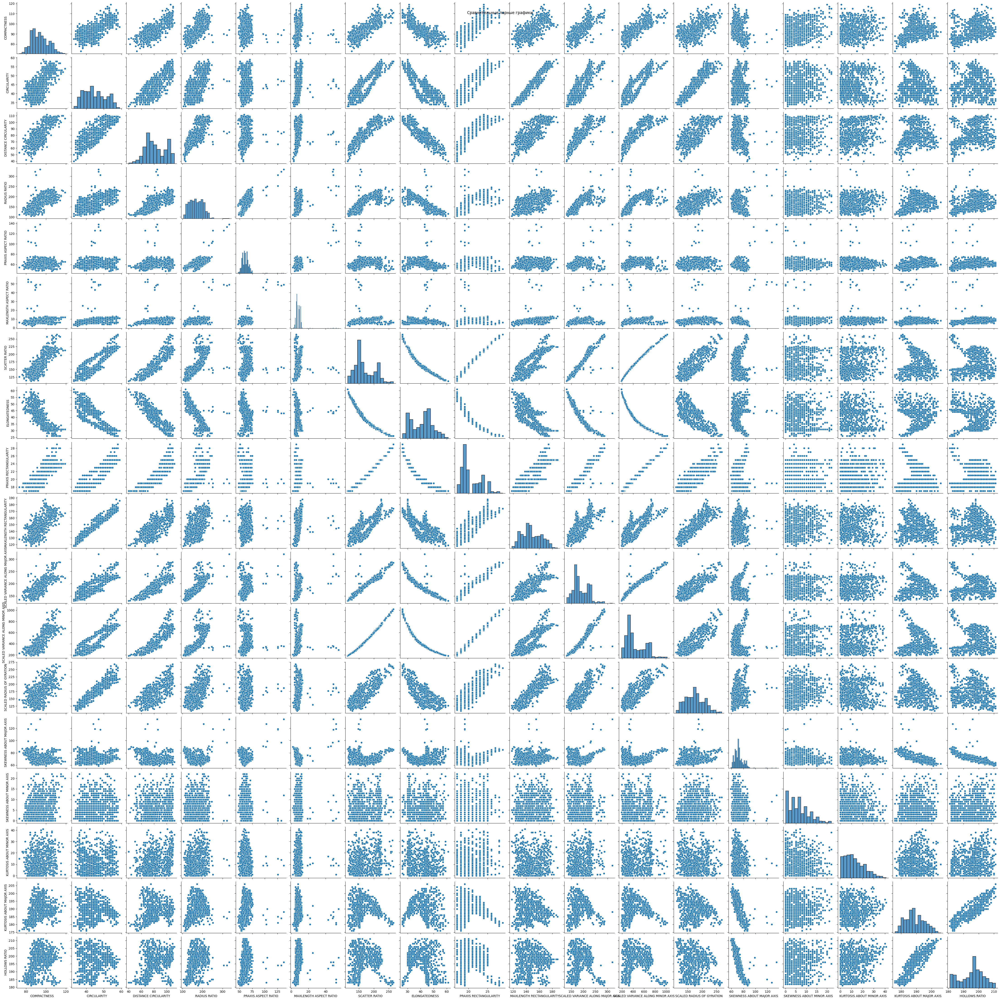

In [16]:
# Построение парных графиков (pairplot)
sns.pairplot(dataset.drop("CLASS LABEL", axis=1))
plt.suptitle('Сравнительные парные графики')
plt.show()

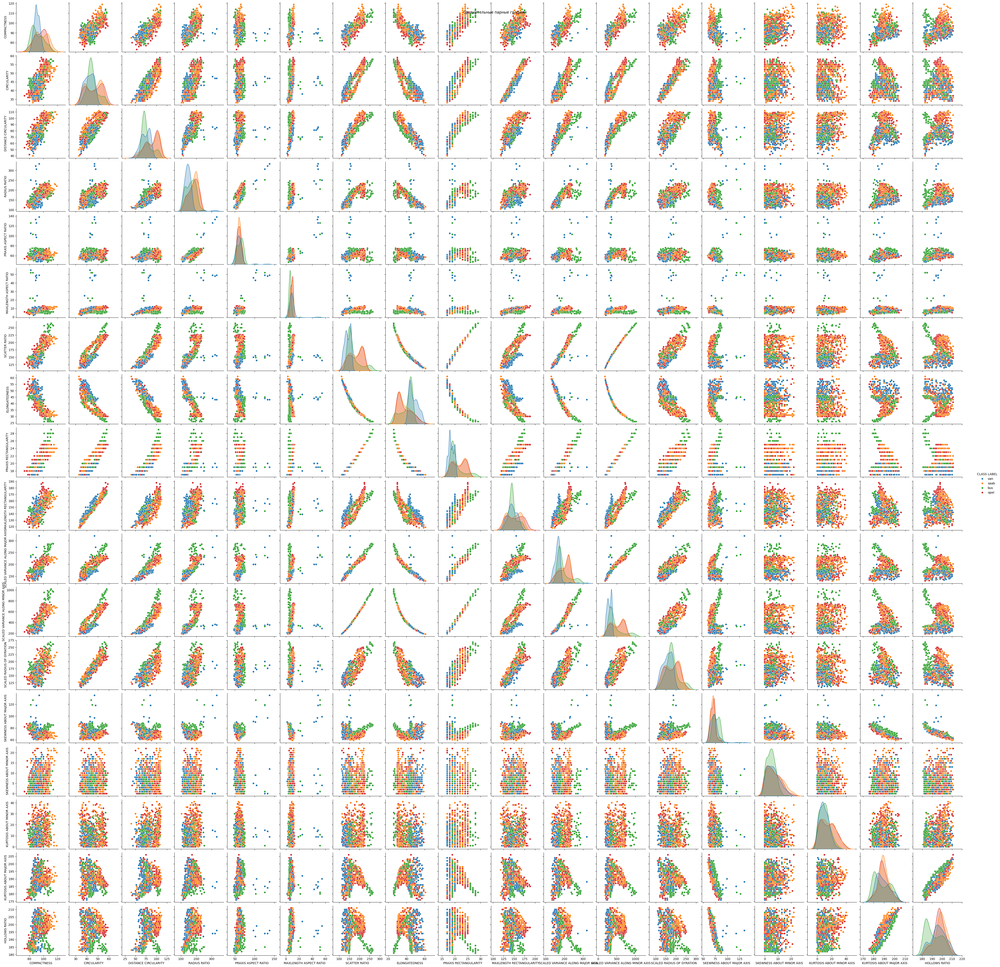

In [26]:
# Построение парных графиков (pairplot), разрез "CLASS LABEL"
sns.pairplot(dataset, hue="CLASS LABEL")
plt.suptitle('Сравнительные парные графики')
plt.show()

### 2. Machine Learning pipeline
Here you are supposed to perform the desired transformations. Please, explain your results briefly after each task.

In [9]:
import pandas as pd
import json
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score, roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
import numpy as np
from itertools import cycle

#### 2.0. Data preprocessing
* Make some transformations of the dataset (if necessary). Briefly explain the transformations

In [10]:
target_elements = 'CLASS LABEL'
# Определение колонок с числовыми данными
numeric_features = dataset.select_dtypes(include='number').columns.tolist()
numeric_features = [item for item in numeric_features if item not in target_elements]

# Определение колонок с категориальными данными
category_features = dataset.select_dtypes(exclude='number').columns.tolist()
category_features = [item for item in category_features if item not in target_elements]

# Определение признаков и целевой переменной
X = dataset.drop(target_elements, axis=1)
y = dataset[target_elements]

# Разделение данных на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Создание трансформера для числовых данных
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Создание трансформера для категориальных данных
cat_transformer = Pipeline(steps=[
    ('one-hot',OneHotEncoder(handle_unknown='ignore'))
])

# Создание ColumnTransformer для применения различных преобразований к разным колонкам
transformers = []
if numeric_features: 
    transformers.append(('num', numeric_transformer, numeric_features))
if category_features:  
    transformers.append(('cat', cat_transformer, category_features))
preprocessor = ColumnTransformer(transformers=transformers)

# Создание Pipeline с предобработкой данных и моделью
pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('model', LogisticRegression(solver='saga', tol=1e-3, max_iter=580)) # remove multi_class='multinomial' warning - 'multi_class' was deprecated in version 1.5 and will be removed in 1.7
])
display(pipeline)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['COMPACTNESS', 'CIRCULARITY',
                                                   'DISTANCE CIRCULARITY',
                                                   'RADIUS RATIO',
                                                   'PRAXIS ASPECT RATIO',
                                                   'MAXLENGTH ASPECT RATIO',
                                                   'SCATTER RATIO',
                                                   'ELONGATEDNESS',
                                                   'PRAXIS RECTANGULARITY',
                                                   'MAXLENGTH RECTANGULARITY',
                                                   'SCALED VARIANCE ALONG '
                                                   'MAJOR AXIS',
                                                   'SCALED VARIANCE ALONG '
                                                   'MINOR AXIS',
                                                   'SCALED RADIUS OF GYRATION',
                                                   'SKEWNESS ABOUT MAJOR AXIS',
                                                   'SKEWNESS ABOUT MINOR AXIS',
                                                   'KURTOSIS ABOUT MINOR AXIS',
                                                   'KURTOSIS ABOUT MAJOR AXIS',
                                                   'HOLLOWS RATIO'])])),
                ('model',
                 LogisticRegression(max_iter=580, solver='saga', tol=0.001))])

To get some insights about the dataset, `pandas` might be used. The `train` part is transformed to `pd.DataFrame` below.

#### 2.1. Basic logistic regression
* Find optimal hyperparameters for logistic regression with cross-validation on the `train` data (small grid/random search is enough, no need to find the *best* parameters).

* Estimate the model quality with `f1` and `accuracy` scores.
* Plot a ROC-curve for the trained model. For the multiclass case you might use `scikitplot` library (e.g. `scikitplot.metrics.plot_roc(test_labels, predicted_proba)`).

*Note: please, use the following hyperparameters for logistic regression: `multi_class='multinomial'`, `solver='saga'` `tol=1e-3` and ` max_iter=500`.*

Best parameter: {'model__C': 10000.0}
F1 Score: 0.7915822221520139
Accuracy Score: 0.7941176470588235


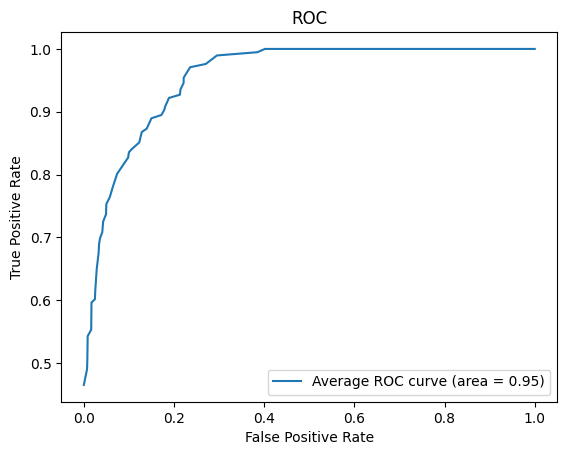

In [11]:
# Определение параметров для поиска
param_grid = {
    'model__C': np.logspace(-4, 4, 10)
}

# Установка поиска с перекрестной проверкой
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=5, scoring='accuracy')

# Обучение модели с использованием grid search
grid_search.fit(X_train, y_train)

# Лучшие параметры
print("Best parameter:", grid_search.best_params_)

# Обучение модели с лучшими параметрами
best_params = grid_search.best_params_
model = grid_search.best_estimator_
model.fit(X_train, y_train)

# Прогнозирование на тестовых данных
y_pred = model.predict(X_test)

# Оценка качества модели
f1 = f1_score(y_test, y_pred, average='weighted') 
print(f"F1 Score: {f1}")

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy}")

## Построение ROC-кривой
# Бинаризация y_test для многоклассовой задачи
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_binarized.shape[1]

# Вычисление ROC-кривой и площади под кривой для каждого класса
fpr = dict()
tpr = dict()
roc_auc = dict()
y_pred_proba = model.predict_proba(X_test)
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Агрегация всех FP
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Интерполяция всех ROC-кривых
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Усреднение и вычисление AUC
mean_tpr /= n_classes

plt.figure()
plt.plot(all_fpr, mean_tpr, label='Average ROC curve (area = {0:0.2f})'.format(roc_auc_score(y_test_binarized, y_pred_proba, average="macro", multi_class="ovr")))

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()


#### 2.2. PCA: explained variance plot
* Apply the PCA to the train part of the data. Build the explaided variance plot. 

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['COMPACTNESS', 'CIRCULARITY',
                                                   'DISTANCE CIRCULARITY',
                                                   'RADIUS RATIO',
                                                   'PRAXIS ASPECT RATIO',
                                                   'MAXLENGTH ASPECT RATIO',
                                                   'SCATTER RATIO',
                                                   'ELONGATEDNESS',
                                                   'PRAXIS RECTANGULARITY',
                                                   'MAXLENGTH RECTANGULARITY',
                                                   'SCALED VARIANCE ALONG '
                                                   'MAJOR AXIS',
                                                   'SCALED VARIANCE ALONG '
                                                   'MINOR AXIS',
                                                   'SCALED RADIUS OF GYRATION',
                                                   'SKEWNESS ABOUT MAJOR AXIS',
                                                   'SKEWNESS ABOUT MINOR AXIS',
                                                   'KURTOSIS ABOUT MINOR AXIS',
                                                   'KURTOSIS ABOUT MAJOR AXIS',
                                                   'HOLLOWS RATIO'])])),
                ('pca', PCA())])

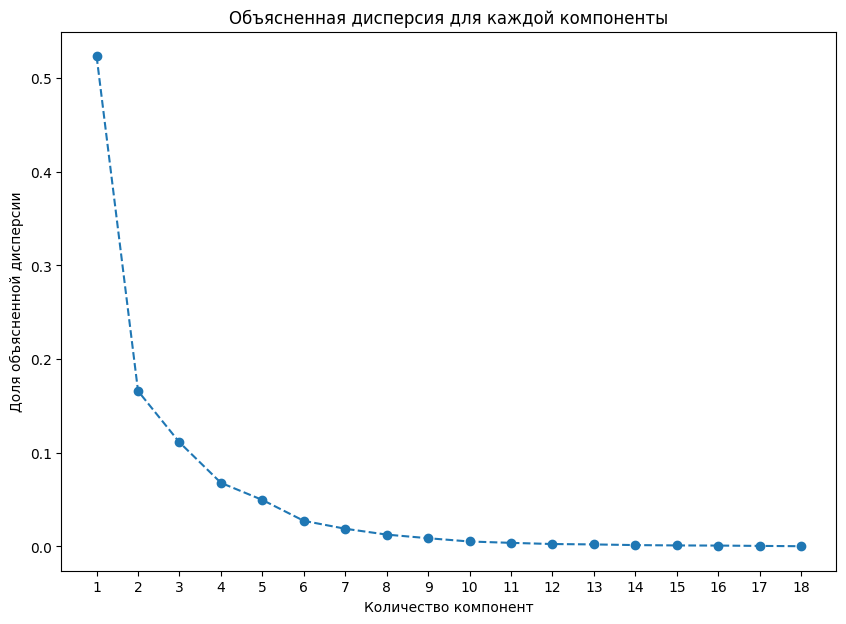

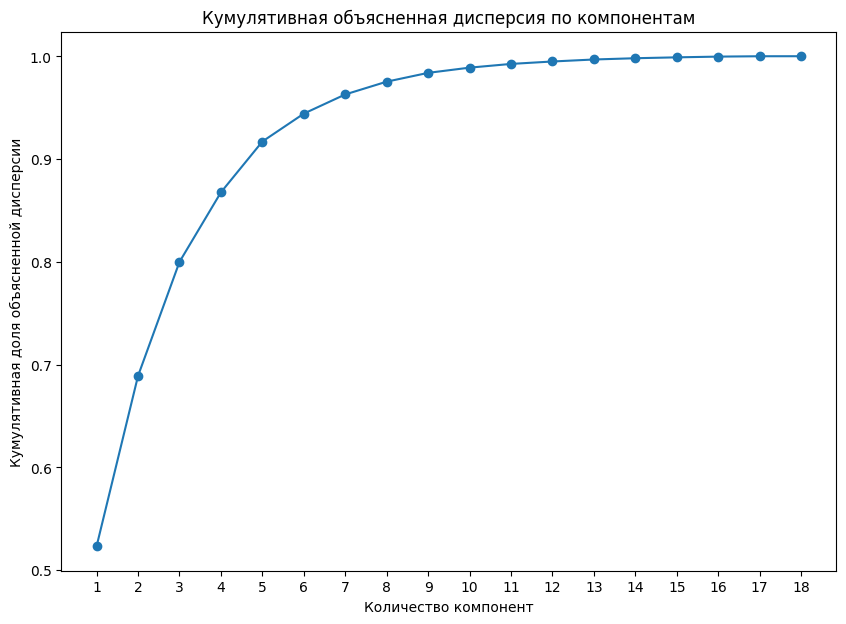

Оптимальное количество компонент для объяснения 95% дисперсии: 7


In [12]:
### YOUR CODE HERE

# Создание pipeline, включающего предобработку и PCA
pipeline_PCA = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('pca', PCA())
])
display(pipeline_PCA)

# Обучение и преобразование обучающих данных
X_train_pca = pipeline_PCA.fit_transform(X_train)

# Извлечение шага PCA из pipeline для доступа к объясненной доле дисперсии
pca = pipeline_PCA.named_steps['pca']

# Построение графика объясненной дисперсии
plt.figure(figsize=(10, 7))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--')
plt.title('Объясненная дисперсия для каждой компоненты')
plt.xlabel('Количество компонент')
plt.ylabel('Доля объясненной дисперсии')
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.show()

# График кумулятивной объясненной дисперсии
plt.figure(figsize=(10, 7))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='-')
plt.title('Кумулятивная объясненная дисперсия по компонентам')
plt.xlabel('Количество компонент')
plt.ylabel('Кумулятивная доля объясненной дисперсии')
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.show()

# Определение оптимального количества главных компонент для объяснения 95% дисперсии
vars = 0.95
cumulative_explained_variance = pca.explained_variance_ratio_.cumsum()
optimal_components = np.argmax(cumulative_explained_variance >= vars) + 1
print(f"Оптимальное количество компонент для объяснения {vars:.0%} дисперсии: {optimal_components}")


#### 2.3. PCA trasformation
* Select the appropriate number of components. Briefly explain your choice. Should you normalize the data?

*Use `fit` and `transform` methods to transform the `train` and `test` parts.*

In [13]:
### YOUR CODE HERE
"""
    Определяет оптимальное количество компонент для PCA.
    Создает пайплайн, включающий предварительную обработку данных и применение PCA.
    Обучает пайплайн на обучающих данных, выполняя предобработку и уменьшение размерности.
    Применяет обученный пайплайн к тестовым данным, выполняя те же шаги предобработки и уменьшения размерности.

Это позволяет обеспечить единообразие предобработки и применения PCA как для обучающих, так и для тестовых данных, что является важным шагом для построения корректных и эффективных моделей машинного обучения.
"""
# Выбранное количество компонентов
n_components = optimal_components

# Определение пайплайна
pipeline_PCA_transform = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('pca', PCA(n_components=n_components))
])
display(pipeline_PCA_transform)

# Обучение PCA и преобразование данных, чтобы уменьшить их размерность до n_components.
X_train_pca_transform = pipeline_PCA_transform.fit_transform(X_train)
X_test_pca_transform = pipeline_PCA_transform.transform(X_test)

print(f'X_train_pca_transform.shape: {X_train_pca_transform.shape}')
print(f'X_test_pca_transform.shape: {X_test_pca_transform.shape}')

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['COMPACTNESS', 'CIRCULARITY',
                                                   'DISTANCE CIRCULARITY',
                                                   'RADIUS RATIO',
                                                   'PRAXIS ASPECT RATIO',
                                                   'MAXLENGTH ASPECT RATIO',
                                                   'SCATTER RATIO',
                                                   'ELONGATEDNESS',
                                                   'PRAXIS RECTANGULARITY',
                                                   'MAXLENGTH RECTANGULARITY',
                                                   'SCALED VARIANCE ALONG '
                                                   'MAJOR AXIS',
                                                   'SCALED VARIANCE ALONG '
                                                   'MINOR AXIS',
                                                   'SCALED RADIUS OF GYRATION',
                                                   'SKEWNESS ABOUT MAJOR AXIS',
                                                   'SKEWNESS ABOUT MINOR AXIS',
                                                   'KURTOSIS ABOUT MINOR AXIS',
                                                   'KURTOSIS ABOUT MAJOR AXIS',
                                                   'HOLLOWS RATIO'])])),
                ('pca', PCA(n_components=7))])

X_train_pca_transform.shape: (676, 7)
X_test_pca_transform.shape: (170, 7)


**Note: From this point `sklearn` [Pipeline](https://scikit-learn.org/stable/modules/compose.html) might be useful to perform transformations on the data. Refer to the [docs](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) for more information.**

#### 2.4. Logistic regression on PCA-preprocessed data.
* Find optimal hyperparameters for logistic regression with cross-validation on the transformed by PCA `train` data.

* Estimate the model quality with `f1` and `accuracy` scores.
* Plot a ROC-curve for the trained model. For the multiclass case you might use `scikitplot` library (e.g. `scikitplot.metrics.plot_roc(test_labels, predicted_proba)`).

*Note: please, use the following hyperparameters for logistic regression: `multi_class='multinomial'`, `solver='saga'` and `tol=1e-3`*

/workspace/.pyenv_mirror/user/current/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/workspace/.pyenv_mirror/user/current/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/workspace/.pyenv_mirror/user/current/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/workspace/.pyenv_mirror/user/current/lib/python3.12/site-packag

Best parameters found: {'C': 2.782559402207126}
F1 Score: 0.6729260992312129
Accuracy Score: 0.6882352941176471


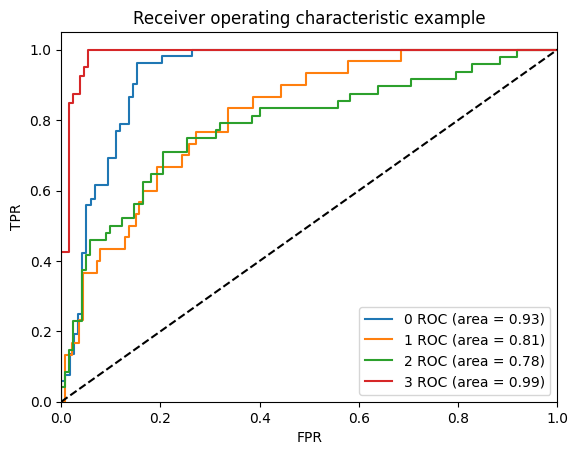

In [39]:
### YOUR CODE HERE
# Define the Logistic Regression Model and Hyperparameter Space
#from scipy import interpolate
#import scipy.interpolate as interp
#import scikitplot as skplt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score

# Define the logistic regression model
model = LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3)

# Define the hyperparameter space for C
param_grid = {
    'C': np.logspace(-4, 4, 10)
}

# Perform Grid Search with Cross-Validation
# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_pca_transform, y_train)

# Output the best parameters
print("Best parameters found:", grid_search.best_params_)

# Retrain the Model with the Best Parameters
# Retrain the model with the best parameters
best_model = LogisticRegression(**grid_search.best_params_, solver='saga', tol=1e-3, max_iter=500)
best_model.fit(X_train_pca_transform, y_train)

# Model Evaluation
# Predictions
y_pred = best_model.predict(X_test_pca_transform)

# Calculate f1 and accuracy scores
f1 = f1_score(y_test, y_pred, average='weighted')
accuracy = accuracy_score(y_test, y_pred)

print(f"F1 Score: {f1}") 
print(f"Accuracy Score: {accuracy}")

# Plot ROC Curve
# Assuming your classes are integer labeled from 0 to n_classes-1
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
n_classes = y_test_bin.shape[1]

# Predict probabilities
y_pred_proba = best_model.predict_proba(X_test_pca_transform)

# Построение ROC-кривой
#skplt.metrics.plot_roc_curve(y_test, y_pred_proba, cmap='nipy_spectral')
#plt.title('ROC-кривая для многоклассовой логистической регрессии')
#plt.show()

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
#for i in range(n_classes):
#    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
#    roc_auc[i] = auc(fpr[i], tpr[i])
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{i} ROC (area = {roc_auc:0.2f})')

# Plot of a ROC curve for a specific class
#for i in range(n_classes):
#    plt.figure()
#plt.plot(fpr[i], tpr[i], label='ROC (area = %0.2f)' % roc_auc[i])
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()


In [34]:
#import matplotlib # import colormaps
#list(colormaps)
import matplotlib.cm
matplotlib.cm.get_cmap('Reds')
#dir(matplotlib.cm) #.get_cmap('Reds')

AttributeError: module 'matplotlib.cm' has no attribute 'get_cmap'

In [35]:
import matplotlib.pyplot as plt
cmap = plt.cm.get_cmap('Reds')

AttributeError: module 'matplotlib.cm' has no attribute 'get_cmap'

#### 2.5. Decision tree
* Now train a desicion tree on the same data. Find optimal tree depth (`max_depth`) using cross-validation.

* Measure the model quality using the same metrics you used above.

In [1341]:
from sklearn.tree import DecisionTreeClassifier

# YOUR CODE HERE
# Define the Decision Tree Model and Parameter Grid
dt_model = DecisionTreeClassifier()

# Define the parameter grid for max_depth
param_grid = {
    'max_depth': range(1, 20)
}

# Perform Grid Search with Cross-Validation
grid_search_dt = GridSearchCV(estimator=dt_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search_dt.fit(X_train_pca, y_train)

# Output the best parameters
print("Best parameters found for Decision Tree:", grid_search_dt.best_params_)

# Retrain the Model with the Best Parameters
best_dt_model = DecisionTreeClassifier(max_depth=grid_search_dt.best_params_['max_depth'])
best_dt_model.fit(X_train_pca, y_train)

# Model Evaluation
y_pred_dt = best_dt_model.predict(X_test_pca)

# Calculate f1 and accuracy scores
f1_dt = f1_score(y_test, y_pred_dt, average='weighted')
accuracy_dt = accuracy_score(y_test, y_pred_dt)

print(f"Decision Tree F1 Score: {f1_dt}")
print(f"Decision Tree Accuracy Score: {accuracy_dt}")



Best parameters found for Decision Tree: {'max_depth': 14}
Decision Tree F1 Score: 0.6179952853374833
Decision Tree Accuracy Score: 0.6195286195286195


#### 2.6. Bagging.
Here starts the ensembling part.

First we will use the __Bagging__ approach. Build an ensemble of $N$ algorithms varying N from $N_{min}=2$ to $N_{max}=100$ (with step 5).

We will build two ensembles: of logistic regressions and of decision trees.

*Comment: each ensemble should be constructed from models of the same family, so logistic regressions should not be mixed up with decision trees.*


*Hint 1: To build a __Bagging__ ensebmle varying the ensemble size efficiently you might generate $N_{max}$ subsets of `train` data (of the same size as the original dataset) using bootstrap procedure once. Then you train a new instance of logistic regression/decision tree with optimal hyperparameters you estimated before on each subset (so you train it from scratch). Finally, to get an ensemble of $N$ models you average the $N$ out of $N_{max}$ models predictions.*

*Hint 2: sklearn might help you with this taks. Some appropriate function/class might be out there.*

* Plot `f1` and `accuracy` scores plots w.r.t. the size of the ensemble.

* Briefly analyse the plot. What is the optimal number of algorithms? Explain your answer.

* How do you think, are the hyperparameters for the decision trees you found in 2.5 optimal for trees used in ensemble? 

In [1344]:
# YOUR CODE HERE
from sklearn.ensemble import BaggingClassifier
# Prepare the Optimal Base Models
logistic_regression_optimal = LogisticRegression(multi_class='multinomial', solver='saga', tol=7.8e-3, C=grid_search.best_params_['C'], max_iter=MAX_ITER)
decision_tree_optimal = DecisionTreeClassifier(max_depth=grid_search_dt.best_params_['max_depth'])

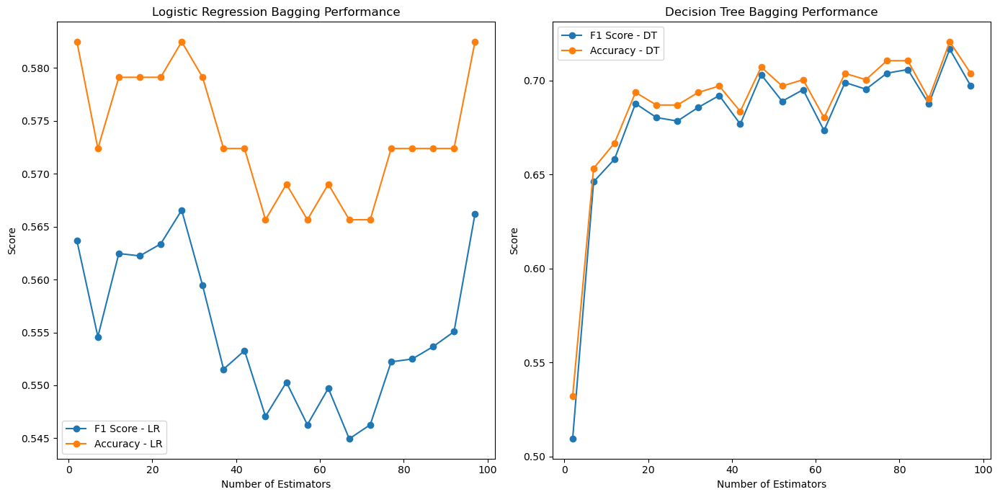

In [1346]:
# Construct the Bagging Ensembles
f1_scores_lr, accuracy_scores_lr = [], []
f1_scores_dt, accuracy_scores_dt = [], []

for n_estimators in range(2, 101, 5):
    # Bagging for logistic regression
    bagging_lr = BaggingClassifier(estimator=logistic_regression_optimal, n_estimators=n_estimators, bootstrap=True, n_jobs=-1)
    bagging_lr.fit(X_train_pca, y_train)
    y_pred_lr = bagging_lr.predict(X_test_pca)
    f1_scores_lr.append(f1_score(y_test, y_pred_lr, average='weighted'))
    accuracy_scores_lr.append(accuracy_score(y_test, y_pred_lr))
    
    # Bagging for decision tree
    bagging_dt = BaggingClassifier(estimator=decision_tree_optimal, n_estimators=n_estimators, bootstrap=True, n_jobs=-1)
    bagging_dt.fit(X_train_pca, y_train)
    y_pred_dt = bagging_dt.predict(X_test_pca)
    f1_scores_dt.append(f1_score(y_test, y_pred_dt, average='weighted'))
    accuracy_scores_dt.append(accuracy_score(y_test, y_pred_dt))

# Plotting
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.plot(range(2, 101, 5), f1_scores_lr, label='F1 Score - LR', marker='o')
plt.plot(range(2, 101, 5), accuracy_scores_lr, label='Accuracy - LR', marker='o')
plt.title('Logistic Regression Bagging Performance')
plt.xlabel('Number of Estimators')
plt.ylabel('Score')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(2, 101, 5), f1_scores_dt, label='F1 Score - DT', marker='o')
plt.plot(range(2, 101, 5), accuracy_scores_dt, label='Accuracy - DT', marker='o')
plt.title('Decision Tree Bagging Performance')
plt.xlabel('Number of Estimators')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.show()


#### 2.7. Random Forest
Now we will work with the Random Forest (its `sklearn` implementation).

* * Plot `f1` and `accuracy` scores plots w.r.t. the number of trees in Random Forest.

* What is the optimal number of trees you've got? Is it different from the optimal number of logistic regressions/decision trees in 2.6? Explain the results briefly.

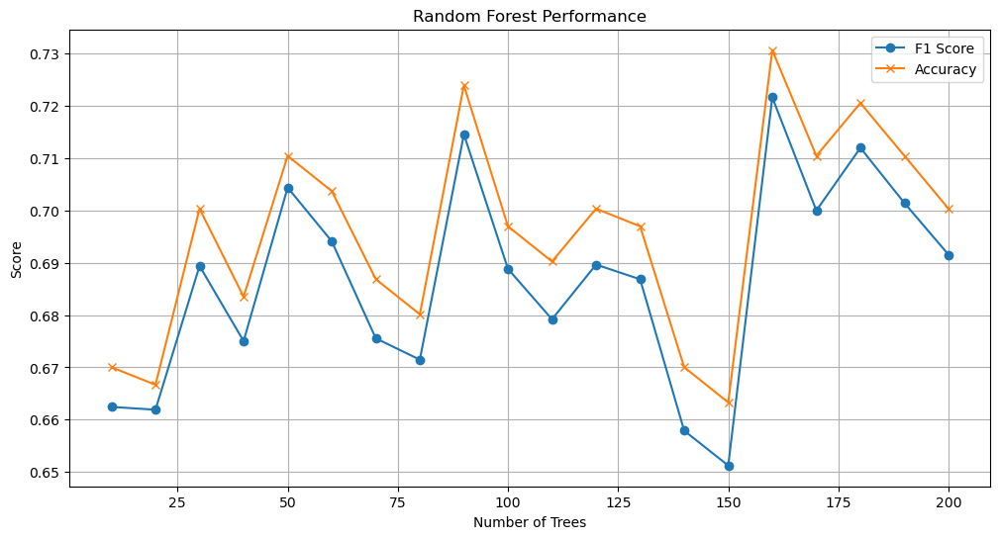

In [1347]:
from sklearn.ensemble import RandomForestClassifier

# YOUR CODE HERE
# Train Random Forest Models with Varying Number of Trees
n_trees_range = range(10, 201, 10)
# Lists to store scores for plotting
f1_scores_rf = []
accuracy_scores_rf = []

for n_trees in n_trees_range:
    # Initialize the Random Forest model
    rf_model = RandomForestClassifier(n_estimators=n_trees, n_jobs=-1)
    
    # Fit the model
    rf_model.fit(X_train_pca, y_train)
    
    # Predict on the test set
    y_pred_rf = rf_model.predict(X_test_pca)
    
    # Calculate and store the scores
    f1_scores_rf.append(f1_score(y_test, y_pred_rf, average='weighted'))
    accuracy_scores_rf.append(accuracy_score(y_test, y_pred_rf))

# Plot F1 and Accuracy Scores
plt.figure(figsize=(12, 6))

# Plotting F1 scores
plt.plot(n_trees_range, f1_scores_rf, label='F1 Score', marker='o')
# Plotting accuracy scores
plt.plot(n_trees_range, accuracy_scores_rf, label='Accuracy', marker='x')

plt.title('Random Forest Performance')
plt.xlabel('Number of Trees')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()





In [1349]:
param_grid = {
    'n_estimators': np.arange(10, 201, 10)  # For example, from 10 to 200, with a step of 10
}
rf_model = RandomForestClassifier()
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='f1_weighted')  # or use 'f1_weighted' for F1 score
grid_search_rf.fit(X_train_pca, y_train)
print("Optimal number of estimators:",  grid_search_rf.best_params_['n_estimators'])

Optimal number of estimators: 180


In [1328]:
param_grid

{'max_depth': range(1, 20)}

#### 2.8. Learning curve
Your goal is to estimate, how does the model behaviour change with the increase of the `train` dataset size.

* Split the training data into 10 equal (almost) parts. Then train the models from above (Logistic regression, Desicion Tree, Random Forest) with optimal hyperparameters you have selected on 1 part, 2 parts (combined, so the train size in increased by 2 times), 3 parts and so on.

* Build a plot of `accuracy` and `f1` scores on `test` part, varying the `train` dataset size (so the axes will be score - dataset size.

* Analyse the final plot. Can you make any conlusions using it? 

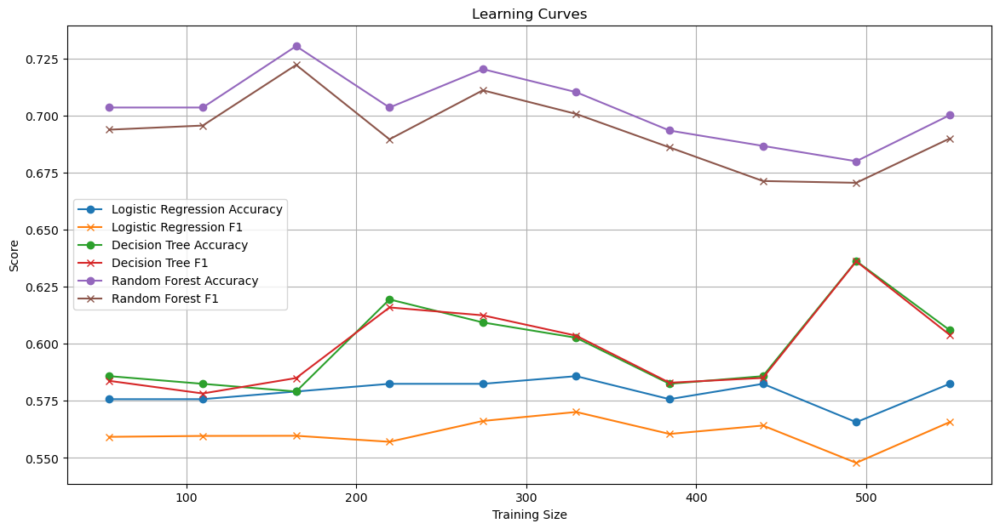

In [1351]:
# YOUR CODE HERE
from sklearn.model_selection import KFold
import numpy as np

# Assuming X_train_pca, y_train, X_test_pca, and y_test are already defined and preprocessed

# Prepare the models with optimal hyperparameters
print(f'grid_search.best_params_: {grid_search.best_params_}')
print(f'grid_search_dt.best_params_: {grid_search_dt.best_params_}')
print(f'grid_search_rf.best_params_: {grid_search_rf.best_params_}')

models = {
    "Logistic Regression": LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3, C=grid_search.best_params_['C'], max_iter=MAX_ITER),
    "Decision Tree": DecisionTreeClassifier(max_depth=grid_search_dt.best_params_['max_depth']),
    "Random Forest": RandomForestClassifier(n_estimators=grid_search_rf.best_params_['n_estimators'], n_jobs=-1)
}

# Initialize scores storage
scores = {model: {'accuracy': [], 'f1': []} for model in models}

# Number of splits
n_splits = 10
kf = KFold(n_splits=n_splits)

for train_index, _ in kf.split(X_train_pca):
    X_train_fold = X_train_pca[train_index]
    y_train_fold = y_train[train_index]
    
    for name, model in models.items():
        # Train the model
        model.fit(X_train_fold, y_train_fold)
        
        # Predict on the test set
        y_pred = model.predict(X_test_pca)
        
        # Calculate scores
        accuracy = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred, average='weighted')
        
        # Store the scores
        scores[name]['accuracy'].append(accuracy)
        scores[name]['f1'].append(f1)

# Plotting the learning curves
plt.figure(figsize=(14, 7))

for name, score in scores.items():
    plt.plot(np.linspace(1, n_splits, n_splits) * (len(X_train_pca) / n_splits), score['accuracy'], label=f"{name} Accuracy", marker='o')
    plt.plot(np.linspace(1, n_splits, n_splits) * (len(X_train_pca) / n_splits), score['f1'], label=f"{name} F1", marker='x')

plt.title('Learning Curves')
plt.xlabel('Training Size')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()
